# Import Libraries and Dataset

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns

In [2]:
df = pd.read_csv("1553768847-housing.csv")
print("Shape of dataset:\n","\t",df.shape)
print("\nCOLUMNS:")
for i in df.columns:
    print("\t",i)
df.head()

Shape of dataset:
 	 (20640, 10)

COLUMNS:
	 longitude
	 latitude
	 housing_median_age
	 total_rooms
	 total_bedrooms
	 population
	 households
	 median_income
	 ocean_proximity
	 median_house_value


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-122.23,37.88,41,880,129.0,322,126,8.3252,NEAR BAY,452600
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,NEAR BAY,358500
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,NEAR BAY,352100
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,NEAR BAY,341300
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,NEAR BAY,342200


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  int64  
 3   total_rooms         20640 non-null  int64  
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  int64  
 6   households          20640 non-null  int64  
 7   median_income       20640 non-null  float64
 8   ocean_proximity     20640 non-null  object 
 9   median_house_value  20640 non-null  int64  
dtypes: float64(4), int64(5), object(1)
memory usage: 1.6+ MB


In [4]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [5]:
df.dropna(inplace=True)

# Histograms

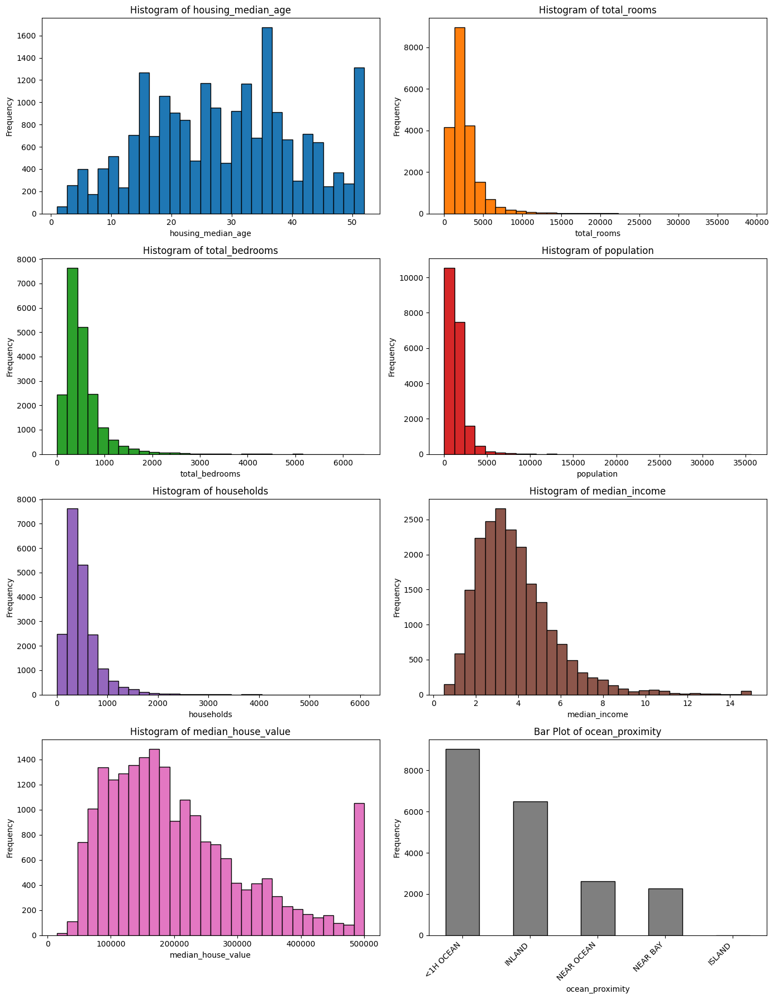

In [6]:

columns_to_plot = [
    'housing_median_age',
    'total_rooms',
    'total_bedrooms',
    'population',
    'households',
    'median_income',
    'median_house_value',
    'ocean_proximity'
]

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(14, 18))
axes = axes.flatten()

colors = [plt.get_cmap('tab10')(i) for i in range(len(columns_to_plot))]

for i, (ax, column) in enumerate(zip(axes, columns_to_plot)):
    if column != 'ocean_proximity':
        data = df[column].dropna()
        ax.hist(data, bins=30, color=colors[i], edgecolor='black')
        ax.set_title(f'Histogram of {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')
    else:
        df[column].value_counts().plot(kind='bar', ax=ax, color=colors[i], edgecolor='black')
        ax.set_title(f'Bar Plot of {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

# Pie Charts

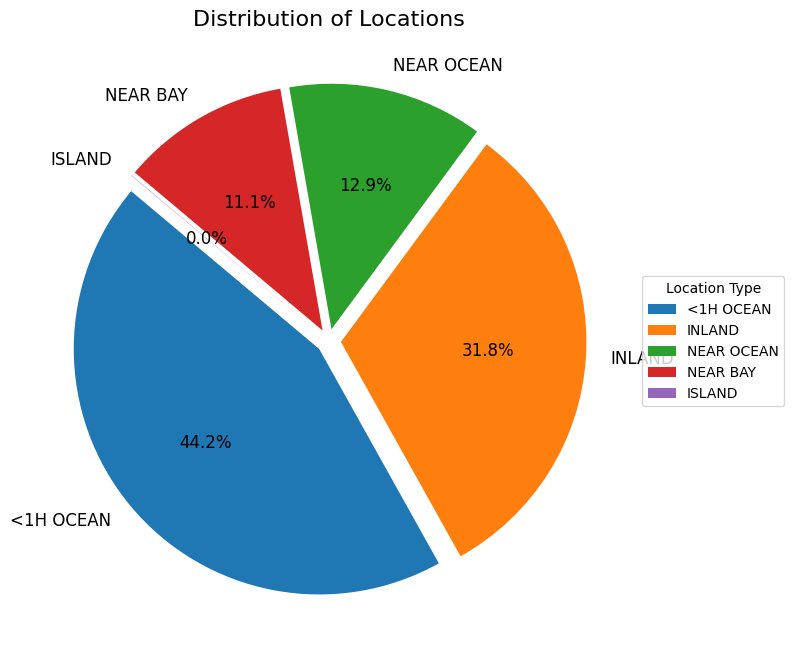

In [7]:
location_counts = df['ocean_proximity'].value_counts()

colors = plt.get_cmap('tab10').colors[:len(location_counts)]

location_counts = location_counts.sort_values(ascending=False)

plt.figure(figsize=(8, 8))
plt.pie(
    location_counts, 
    labels=location_counts.index, 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=colors, 
    textprops={'fontsize': 12, 'color': 'black'},
    explode=[0.05] * len(location_counts)  # Slightly separate the slices
)

plt.title('Distribution of Locations', fontsize=16)
plt.legend(location_counts.index, title='Location Type', loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()

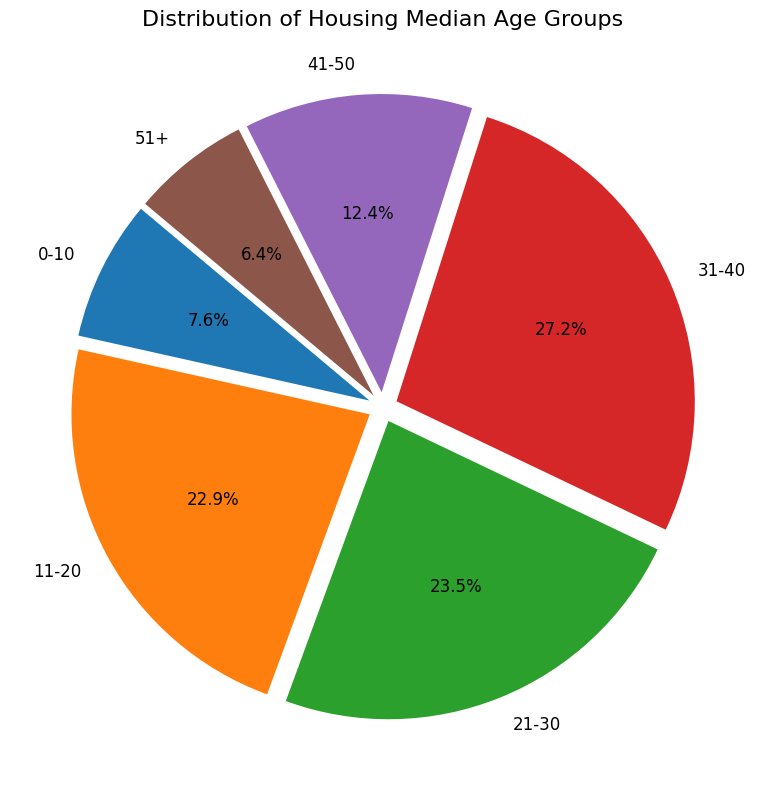

In [8]:
bins = [0, 10, 20, 30, 40, 50, df['housing_median_age'].max()]
labels = ['0-10', '11-20', '21-30', '31-40', '41-50', '51+']

df['housing_median_age'] = df['housing_median_age'].fillna(-1)

df['age_group'] = pd.cut(df['housing_median_age'], bins=bins, labels=labels, include_lowest=True)

age_group_counts = df['age_group'].value_counts().sort_index()

colors = plt.get_cmap('tab10').colors[:len(age_group_counts)]

plt.figure(figsize=(8, 8))
plt.pie(
    age_group_counts, 
    labels=age_group_counts.index, 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=colors, 
    textprops={'fontsize': 12, 'color': 'black'},
    explode=[0.05] * len(age_group_counts)
)

plt.title('Distribution of Housing Median Age Groups', fontsize=16)
plt.tight_layout()

plt.show()

# Scatterplots

/tmp/ipykernel_13123/1394440059.py:8: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  scatter = sns.scatterplot(


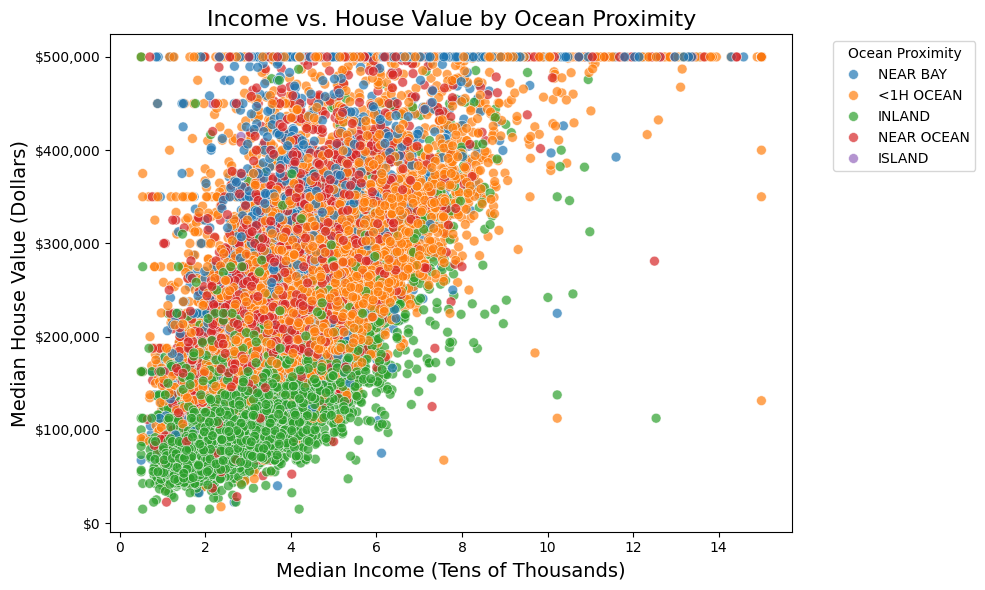

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

cmap = plt.get_cmap('tab10')
colors = [cmap(i) for i in range(cmap.N)]

plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(
    data=df, 
    x='median_income', 
    y='median_house_value', 
    hue='ocean_proximity', 
    palette=colors, 
    alpha=0.7, 
    s=50,
    edgecolor='w',  
    linewidth=0.5
)

plt.title('Income vs. House Value by Ocean Proximity', fontsize=16)
plt.xlabel('Median Income (Tens of Thousands)', fontsize=14)
plt.ylabel('Median House Value (Dollars)', fontsize=14)

plt.legend(title='Ocean Proximity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "${:,}".format(int(x))))

plt.tight_layout()
plt.show()

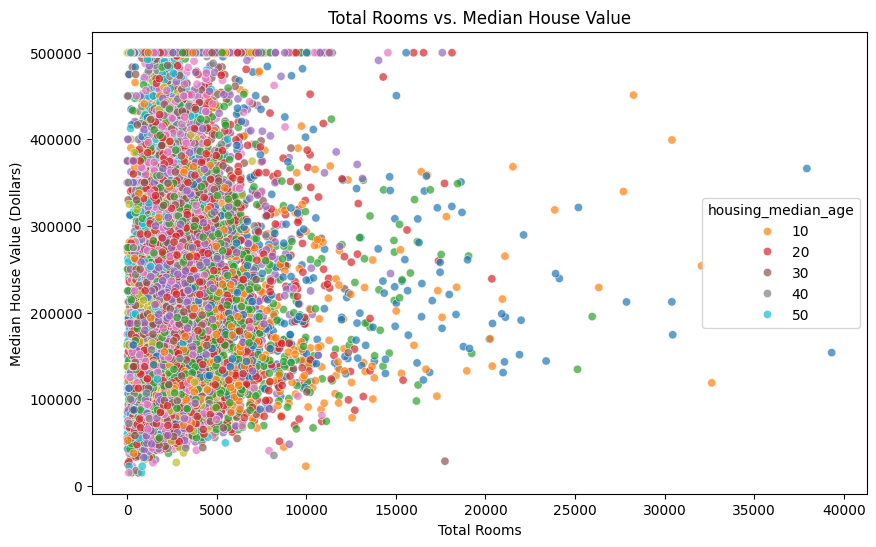

In [10]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df, 
    x='total_rooms', 
    y='median_house_value', 
    hue='housing_median_age', 
    palette=plt.get_cmap('tab10'),
    alpha=0.7
)
plt.title('Total Rooms vs. Median House Value')
plt.xlabel('Total Rooms')
plt.ylabel('Median House Value (Dollars)')
plt.show()

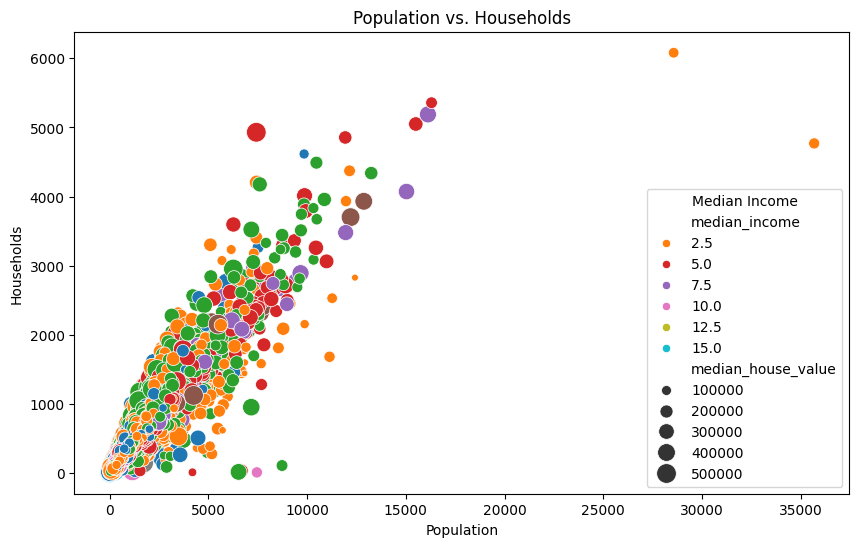

In [11]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df, 
    x='population', 
    y='households', 
    hue='median_income', 
    palette=plt.get_cmap('tab10'),  # Using 'tab10' colormap
    size='median_house_value', 
    sizes=(20, 200)
)
plt.title('Population vs. Households')
plt.xlabel('Population')
plt.ylabel('Households')
plt.legend(title='Median Income')
plt.show()

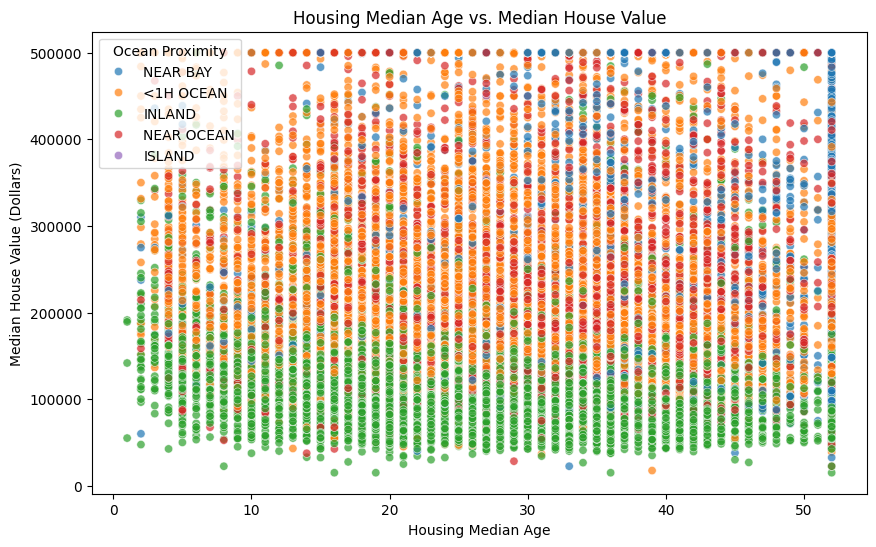

In [12]:
tab10_colors = plt.get_cmap('tab10').colors

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df, 
    x='housing_median_age', 
    y='median_house_value', 
    hue='ocean_proximity', 
    palette=tab10_colors, 
    alpha=0.7
)
plt.title('Housing Median Age vs. Median House Value')
plt.xlabel('Housing Median Age')
plt.ylabel('Median House Value (Dollars)')
plt.legend(title='Ocean Proximity')
plt.show()

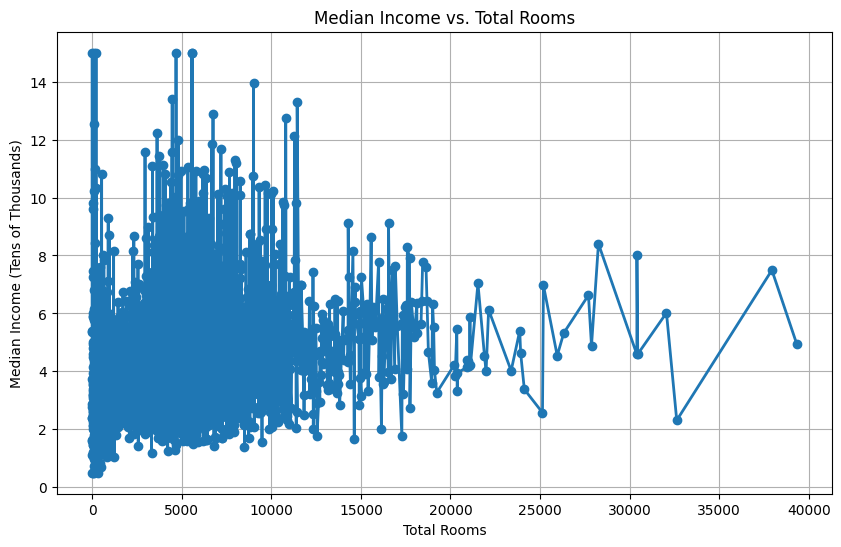

In [13]:
df_grouped_rooms = df.groupby('total_rooms')['median_income'].mean().reset_index()

plt.figure(figsize=(10, 6))
colors = plt.get_cmap('tab10').colors
plt.plot(df_grouped_rooms['total_rooms'], df_grouped_rooms['median_income'], marker='o', color=colors[0], linestyle='-', linewidth=2)
plt.title('Median Income vs. Total Rooms')
plt.xlabel('Total Rooms')
plt.ylabel('Median Income (Tens of Thousands)')
plt.grid(True)
plt.show()

# Bar Charts

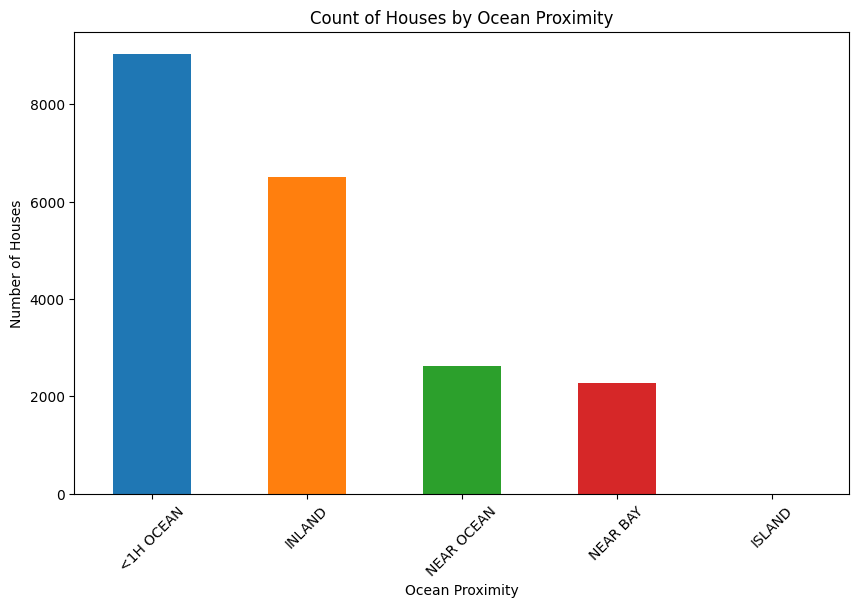

In [14]:
ocean_proximity_counts = df['ocean_proximity'].value_counts()

tab10_colors = plt.get_cmap('tab10').colors

plt.figure(figsize=(10, 6))

ocean_proximity_counts.plot(kind='bar', color=tab10_colors[:len(ocean_proximity_counts)])
plt.title('Count of Houses by Ocean Proximity')
plt.xlabel('Ocean Proximity')
plt.ylabel('Number of Houses')
plt.xticks(rotation=45)
plt.show()

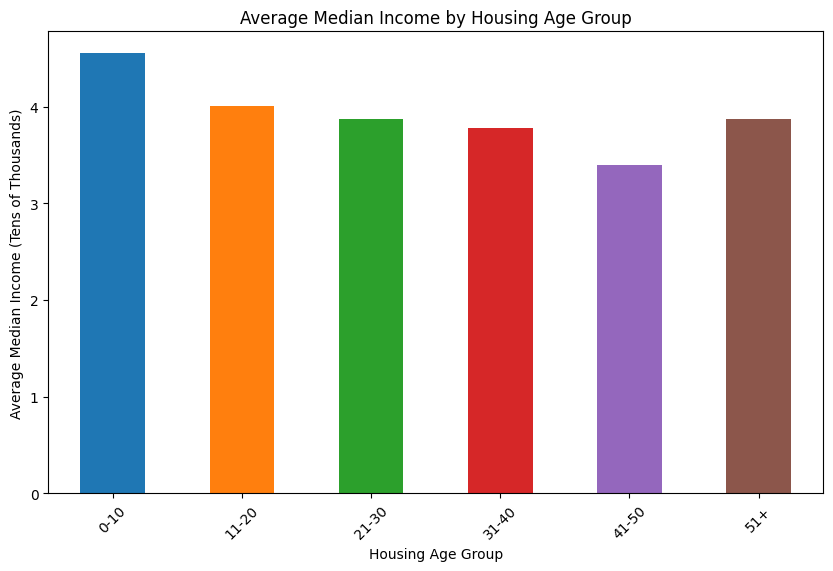

In [15]:
bins = [0, 10, 20, 30, 40, 50, df['housing_median_age'].max()]
labels = ['0-10', '11-20', '21-30', '31-40', '41-50', '51+']

df['age_group'] = pd.cut(df['housing_median_age'], bins=bins, labels=labels, include_lowest=True)

avg_income_by_age = df.groupby('age_group', observed=True)['median_income'].mean()

tab10_colors = plt.get_cmap('tab10').colors

plt.figure(figsize=(10, 6))
avg_income_by_age.plot(kind='bar', color=tab10_colors[:len(avg_income_by_age)])
plt.title('Average Median Income by Housing Age Group')
plt.xlabel('Housing Age Group')
plt.ylabel('Average Median Income (Tens of Thousands)')
plt.xticks(rotation=45)
plt.show()

# Stacked bar chart

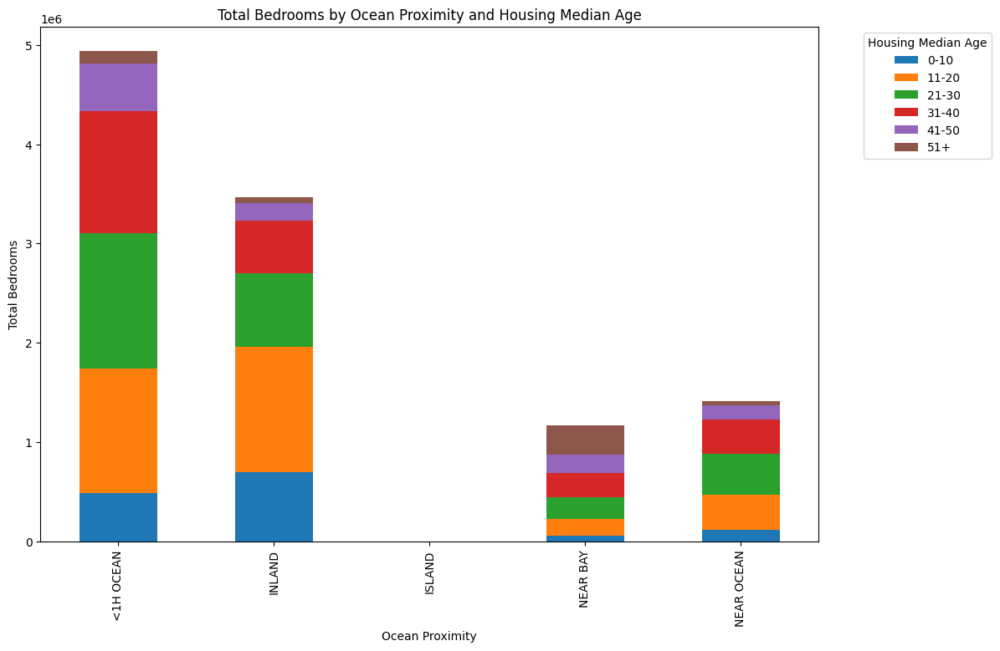

In [16]:
bins = [0, 10, 20, 30, 40, 50, df['housing_median_age'].max()]
labels = ['0-10', '11-20', '21-30', '31-40', '41-50', '51+']
df['age_group'] = pd.cut(df['housing_median_age'], bins=bins, labels=labels, include_lowest=True)

bedrooms_age_ocean = df.pivot_table(values='total_bedrooms', index='ocean_proximity', columns='age_group', aggfunc='sum', fill_value=0, observed=False)

colors = plt.get_cmap('tab10').colors
bedrooms_age_ocean.plot(kind='bar', stacked=True, figsize=(12, 8), color=colors)
plt.title('Total Bedrooms by Ocean Proximity and Housing Median Age')
plt.xlabel('Ocean Proximity')
plt.ylabel('Total Bedrooms')
plt.legend(title='Housing Median Age', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

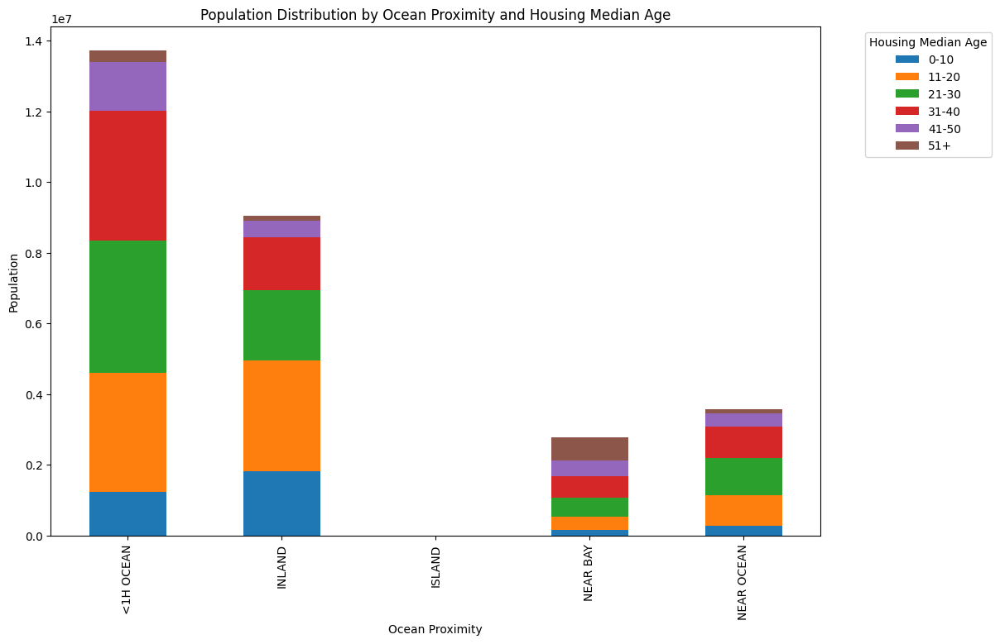

In [17]:
population_age_ocean = df.pivot_table(values='population', index='ocean_proximity', columns='age_group', aggfunc='sum', fill_value=0, observed=False)

colors = plt.get_cmap('tab10').colors
population_age_ocean.plot(kind='bar', stacked=True, figsize=(12, 8), color=colors)
plt.title('Population Distribution by Ocean Proximity and Housing Median Age')
plt.xlabel('Ocean Proximity')
plt.ylabel('Population')
plt.legend(title='Housing Median Age', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Dot plots / Line charts

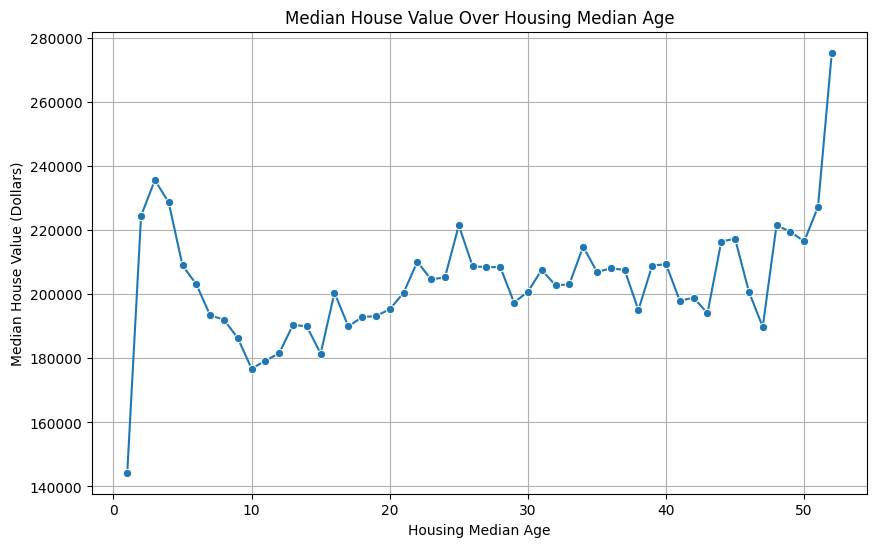

In [18]:
df_grouped = df.groupby('housing_median_age')['median_house_value'].mean().reset_index()

plt.figure(figsize=(10, 6))
colors = plt.get_cmap('tab10').colors
sns.lineplot(data=df_grouped, x='housing_median_age', y='median_house_value', marker='o', color=colors[0])
plt.title('Median House Value Over Housing Median Age')
plt.xlabel('Housing Median Age')
plt.ylabel('Median House Value (Dollars)')
plt.grid(True)
plt.show()

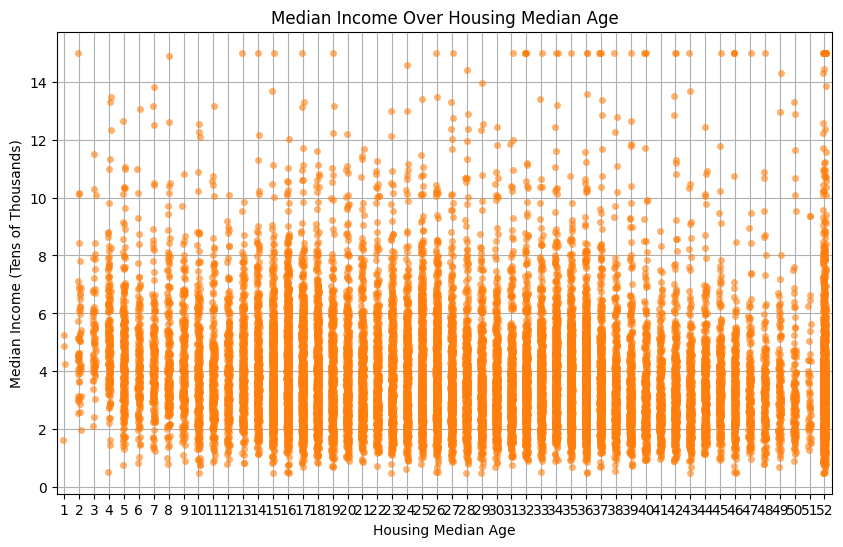

In [19]:
plt.figure(figsize=(10, 6))
colors = plt.get_cmap('tab10').colors
sns.stripplot(data=df, x='housing_median_age', y='median_income', jitter=True, alpha=0.6, color=colors[1])
plt.title('Median Income Over Housing Median Age')
plt.xlabel('Housing Median Age')
plt.ylabel('Median Income (Tens of Thousands)')
plt.grid(True)
plt.show()

# Box Plot

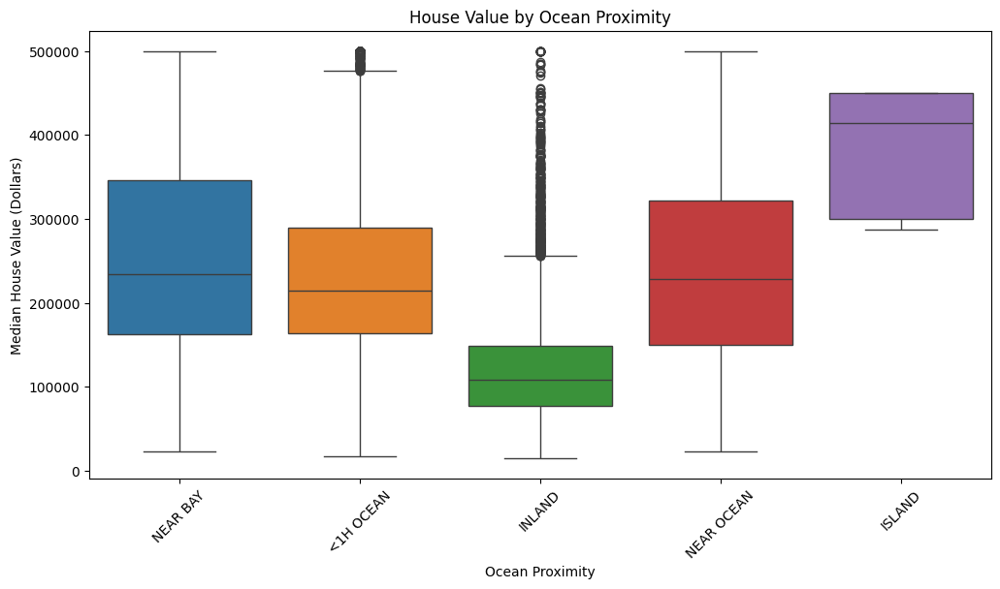

In [32]:
plt.figure(figsize=(12, 6))
tab10_colors = plt.get_cmap('tab10').colors
sns.boxplot(data=df, x='ocean_proximity', y='median_house_value', hue='ocean_proximity', palette=tab10_colors, dodge=False)
plt.title('House Value by Ocean Proximity')
plt.xlabel('Ocean Proximity')
plt.ylabel('Median House Value (Dollars)')
plt.xticks(rotation=45)
plt.legend([], [], frameon=False)
plt.show()

# Gantt Chart

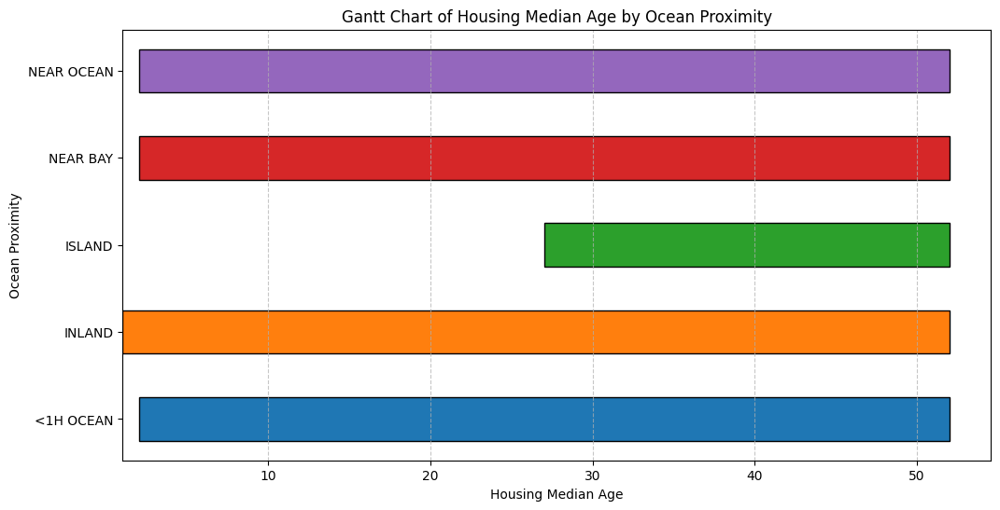

In [20]:
df_sample = df.groupby('ocean_proximity')['housing_median_age'].agg(['min', 'max']).reset_index()

df_sample['duration'] = df_sample['max'] - df_sample['min']

plt.figure(figsize=(12, 6))
colors = plt.get_cmap('tab10').colors

for i, (index, row) in enumerate(df_sample.iterrows()):
    plt.barh(row['ocean_proximity'], row['duration'], left=row['min'], color=colors[i % len(colors)], edgecolor='black', height=0.5)

plt.title('Gantt Chart of Housing Median Age by Ocean Proximity')
plt.xlabel('Housing Median Age')
plt.ylabel('Ocean Proximity')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

# Polar Area Chart

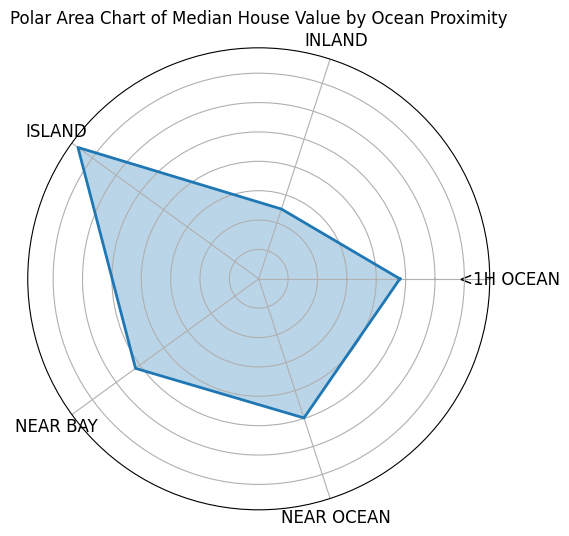

In [21]:
mean_values = df.groupby('ocean_proximity')['median_house_value'].mean().reset_index()

categories = mean_values['ocean_proximity']
values = mean_values['median_house_value']
angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()

values = np.concatenate((values, [values[0]]))
angles += angles[:1]

colors = plt.get_cmap('tab10').colors
chosen_color = colors[0]

fig, ax = plt.subplots(figsize=(8, 6), subplot_kw=dict(polar=True))
ax.fill(angles, values, color=chosen_color, alpha=0.3)
ax.plot(angles, values, color=chosen_color, linewidth=2)

ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=12)

plt.title('Polar Area Chart of Median House Value by Ocean Proximity')
plt.show()

# Maps

In [22]:
colors = plt.get_cmap('tab10').colors
chosen_color = colors[0]

chosen_color_hex = '#{:02x}{:02x}{:02x}'.format(int(chosen_color[0] * 255),
                                                 int(chosen_color[1] * 255),
                                                 int(chosen_color[2] * 255))

fig = px.scatter_mapbox(
    df, 
    lat="latitude", 
    lon="longitude", 
    hover_name="median_house_value", 
    hover_data=["housing_median_age", "total_rooms", "total_bedrooms", "population", "households", "median_income", "ocean_proximity"],
    color_discrete_sequence=[chosen_color_hex],
    zoom=6, 
    height=800
)

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=6, 
    mapbox_center={"lat": df["latitude"].mean(), "lon": df["longitude"].mean()},
    title="Houses on the Map"
)

fig.show()

In [23]:
df['median_house_value_category'] = pd.qcut(df['median_house_value'], q=3, labels=['few', 'average', 'high'])
column_count = df["median_house_value_category"].value_counts()
column_count = pd.DataFrame({'Category': column_count.index, 'Count': column_count.values})
column_count.head(len(column_count))

,Category,Count
0,few,6812
1,average,6812
2,high,6809


In [24]:
colors = plt.get_cmap('tab10').colors
custom_colors = {
    "few": '#{:02x}{:02x}{:02x}'.format(int(colors[0][0] * 255), int(colors[0][1] * 255), int(colors[0][2] * 255)),
    "average": '#{:02x}{:02x}{:02x}'.format(int(colors[1][0] * 255), int(colors[1][1] * 255), int(colors[1][2] * 255)),
    "high": '#{:02x}{:02x}{:02x}'.format(int(colors[3][0] * 255), int(colors[3][1] * 255), int(colors[3][2] * 255))
}

fig = px.scatter_mapbox(
    df, 
    lat="latitude", 
    lon="longitude", 
    hover_name="median_house_value", 
    hover_data=["housing_median_age", "total_rooms", "total_bedrooms", "population", "households", "median_income", "ocean_proximity"],
    color="median_house_value_category", 
    color_discrete_map=custom_colors,
    zoom=6, 
    height=800
)

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=6, 
    mapbox_center={"lat": df["latitude"].mean(), "lon": df["longitude"].mean()},
    title="Houses on the Map"
)

fig.show()

In [25]:
df['median_income_category'] = pd.qcut(df['median_income'], q=3, labels=['few', 'average', 'high'])
column_count = df["median_income_category"].value_counts()
column_count = pd.DataFrame({'Category': column_count.index, 'Count': column_count.values})
column_count.head(len(column_count))

,Category,Count
0,few,6811
1,average,6811
2,high,6811


In [26]:

tab10_colors = plt.get_cmap('tab10').colors

color_discrete_map = {
    "few": '#{:02x}{:02x}{:02x}'.format(int(tab10_colors[0][0] * 255), int(tab10_colors[0][1] * 255), int(tab10_colors[0][2] * 255)),
    "average": '#{:02x}{:02x}{:02x}'.format(int(tab10_colors[1][0] * 255), int(tab10_colors[1][1] * 255), int(tab10_colors[1][2] * 255)),
    "high": '#{:02x}{:02x}{:02x}'.format(int(tab10_colors[3][0] * 255), int(tab10_colors[3][1] * 255), int(tab10_colors[3][2] * 255))
}

fig = px.scatter_mapbox(
    df, 
    lat="latitude", 
    lon="longitude", 
    hover_name="median_house_value", 
    hover_data=["housing_median_age", "total_rooms", "total_bedrooms", "population", "households", "median_income", "ocean_proximity"],
    color="median_income_category",  
    color_discrete_map=color_discrete_map,
    zoom=6, 
    height=800
)

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=6, 
    mapbox_center={"lat": df["latitude"].mean(), "lon": df["longitude"].mean()},
    title="Houses on the Map"
)

fig.show()


In [27]:
df['housing_median_age_category'] = pd.qcut(df['housing_median_age'], q=3, labels=['new', 'average', 'old'])
column_count = df["housing_median_age_category"].value_counts()
column_count = pd.DataFrame({'Make': column_count.index, 'Count': column_count.values})
column_count.head(len(column_count))

,Make,Count
0,average,7082
1,new,7075
2,old,6276


In [28]:
tab10_colors = plt.get_cmap('tab10').colors

color_discrete_map = {
    "new": '#{:02x}{:02x}{:02x}'.format(int(tab10_colors[0][0] * 255), int(tab10_colors[0][1] * 255), int(tab10_colors[0][2] * 255)),
    "average": '#{:02x}{:02x}{:02x}'.format(int(tab10_colors[1][0] * 255), int(tab10_colors[1][1] * 255), int(tab10_colors[1][2] * 255)),
    "old": '#{:02x}{:02x}{:02x}'.format(int(tab10_colors[3][0] * 255), int(tab10_colors[3][1] * 255), int(tab10_colors[3][2] * 255))
}

fig = px.scatter_mapbox(
    df, 
    lat="latitude", 
    lon="longitude", 
    hover_name="median_house_value", 
    hover_data=["housing_median_age", "total_rooms", "total_bedrooms", "population", "households", "median_income", "ocean_proximity"],
    color="housing_median_age_category", 
    color_discrete_map=color_discrete_map,  
    zoom=6, 
    height=800
)

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=6, 
    mapbox_center={"lat": df["latitude"].mean(), "lon": df["longitude"].mean()},
    title="Houses on the Map"
)

fig.show()